# 1. NLP_Feature_Engineering Overview
tf-idf, LDA

In [1]:
###################################!pip install --upgrade pip################# upgrade pip ###############################
#python version 3.9 will fix collections import error
#!pip install gensim --verbose
#!pip install emojis matplotlib wordcloud
#!pip install emojis

In [2]:
#!pip install pandas
#!pip install numpy
#!pip install nltk
#!pip install matplotlib
#!pip install spacy
#!pip install re
#!pip install tqdm
#!pip install collections
#!python -m spacy download en_core_web_sm
#! pip install wordcloud

In [3]:
import nltk
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\wuhangze\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\wuhangze\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\wuhangze\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [5]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.stem import SnowballStemmer
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords

#!python -m spacy download en_core_web_sm
import spacy

import re
from collections import Counter

from tqdm import tqdm
tqdm.pandas()

from wordcloud import WordCloud

## 2. tf-idf, LDA

In [6]:
directory_path = 'D:/Hangze Wu/BSE/DSDM/semester3/Master Thesis/github_thesis/deloitte_digital_banking/tucapital_scraper/downloads/'
translated_news_save_path = "tucapital-news_with_text-translated.csv"

# modify format
# Save the combined DataFrame to a CSV file
df_copy = pd.read_csv(directory_path+translated_news_save_path)
df_copy.head()

,Unnamed: 0,title,url,date,text
0,0,"Tomorrow, last day of the account at 2.89% APR...",https://www.tucapital.es/depositos/manana-ulti...,23/04/2024,"Tomorrow, April 24, 2024, the marketing period..."
1,1,ING gives you up to €120 if you direct your pa...,https://www.tucapital.es/cuentas/ing-te-da-has...,22/04/2024,"ING now asks, in addition to direct debiting a..."
2,2,Banco BIG deposits: slight increase in normal ...,https://www.tucapital.es/depositos/depositos-d...,22/04/2024,Banco BIG remodels its deposit offer with slig...
3,3,The future of Bitcoin: predictions for the nex...,https://www.tucapital.es/blogs/guias/el-futuro...,22/04/2024,"Since its launch, Bitcoin has seen positive an..."
4,4,Eco: Cetelem only allows maximum daily transfe...,https://www.tucapital.es/blogs/eco/eco-cetelem...,19/04/2024,"Due to the disappearance of Orange Bank, and t..."


### 2. Feature Engineering Extraction

In [7]:
# Filter where Not-expected rows
date_pattern = re.compile(r'-\d{2}/\d{2}/\d{4}:')
df_cleaned = df_copy[~df_copy['title'].str.contains(date_pattern)]
# Drop nan
df_cleaned = df_cleaned.dropna(subset=['title', 'url', 'date'])

df_copy.shape, df_cleaned.shape

((1025, 5), (1018, 5))

In [8]:
df_cleaned['combined_text'] = (df_cleaned['title'] + ' ') * 3 + df_cleaned['text']

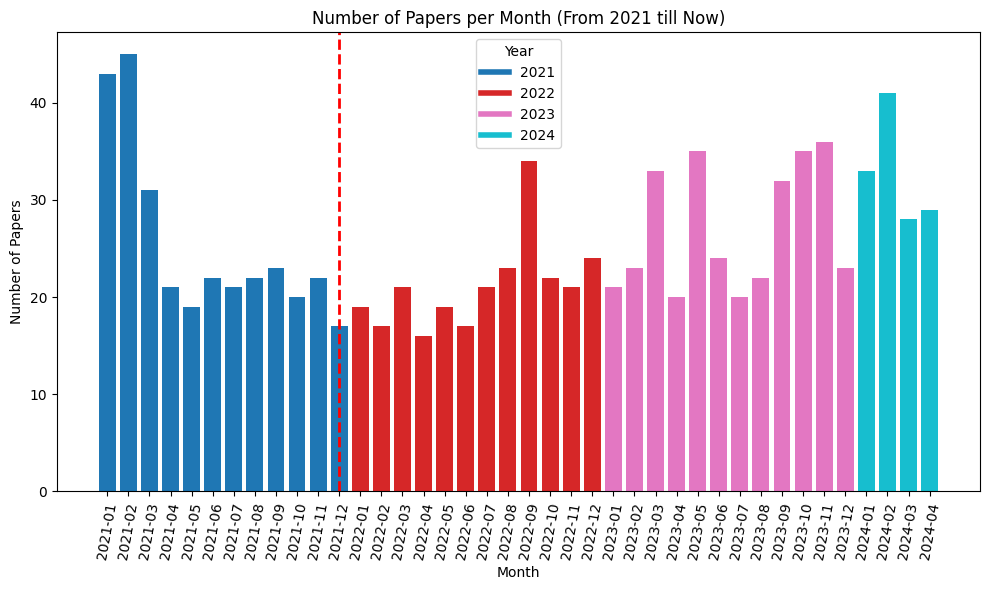

In [9]:
df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

# Filter the DataFrame to only include dates from 2021 to now
df_filtered = df_cleaned[(df_cleaned['date'] >= '2021-01-01') & (df_cleaned['date'] <= pd.Timestamp.today())]

# Group by month and count entries
df_grouped = df_filtered.groupby(pd.Grouper(key='date', freq='M')).size()

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Assign colors to each year
years = df_grouped.index.year
unique_years = years.unique()
colors = plt.get_cmap('tab10', len(unique_years))

# Plot each bar with the corresponding color
bars = []
for i, (date, count) in enumerate(df_grouped.items()):
    color = colors(unique_years.tolist().index(date.year))
    bars.append(ax.bar(i, count, color=color))

# Set x-ticks
ax.set_xticks(range(len(df_grouped)))
ax.set_xticklabels([date.strftime('%Y-%m') for date in df_grouped.index], rotation=80)

# Create a custom legend
handles = [plt.Line2D([0], [0], color=colors(i), lw=4) for i in range(len(unique_years))]
labels = unique_years
ax.legend(handles, labels, title='Year')

# Add vertical line for December 2021
start_month_index = df_grouped.index.get_loc('2021-12-31')
ax.axvline(x=start_month_index, color='red', linestyle='--', linewidth=2, label='Start of Web Traffic Data')

# Title and labels
ax.set_title('Number of Papers per Month (From 2021 till Now)')
ax.set_xlabel('Month')
ax.set_ylabel('Number of Papers')

plt.tight_layout()
plt.show()


In [10]:
# Ensure 'combined_text' column is in the DataFrame
df_cleaned['combined_text'] = df_cleaned['combined_text'].astype(str)  # Convert to string in case it's not

# Count the number of words in each entry
df_cleaned['word_count'] = df_cleaned['combined_text'].apply(lambda x: len(x.split()))

# Verify the word counts
df_cleaned.head()

,Unnamed: 0,title,url,date,text,combined_text,word_count
0,0,"Tomorrow, last day of the account at 2.89% APR...",https://www.tucapital.es/depositos/manana-ulti...,2024-04-23,"Tomorrow, April 24, 2024, the marketing period...","Tomorrow, last day of the account at 2.89% APR...",318
1,1,ING gives you up to €120 if you direct your pa...,https://www.tucapital.es/cuentas/ing-te-da-has...,2024-04-22,"ING now asks, in addition to direct debiting a...",ING gives you up to €120 if you direct your pa...,400
2,2,Banco BIG deposits: slight increase in normal ...,https://www.tucapital.es/depositos/depositos-d...,2024-04-22,Banco BIG remodels its deposit offer with slig...,Banco BIG deposits: slight increase in normal ...,476
3,3,The future of Bitcoin: predictions for the nex...,https://www.tucapital.es/blogs/guias/el-futuro...,2024-04-22,"Since its launch, Bitcoin has seen positive an...",The future of Bitcoin: predictions for the nex...,656
4,4,Eco: Cetelem only allows maximum daily transfe...,https://www.tucapital.es/blogs/eco/eco-cetelem...,2024-04-19,"Due to the disappearance of Orange Bank, and t...",Eco: Cetelem only allows maximum daily transfe...,450


In [11]:
# Convert the 'date' column to datetime if not already
df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

# Filter the DataFrame to only include dates from 2021 to now
df_filtered = df_cleaned[(df_cleaned['date'] >= '2021-01-01') & (df_cleaned['date'] <= pd.Timestamp.today())]

# Group by month and sum the word counts
df_grouped_words = df_filtered.groupby(pd.Grouper(key='date', freq='M'))['word_count'].sum()

# Verify the grouped data
df_grouped_words.head()

date
2021-01-31    25283
2021-02-28    26524
2021-03-31    17448
2021-04-30    11207
2021-05-31     9619
Freq: ME, Name: word_count, dtype: int64

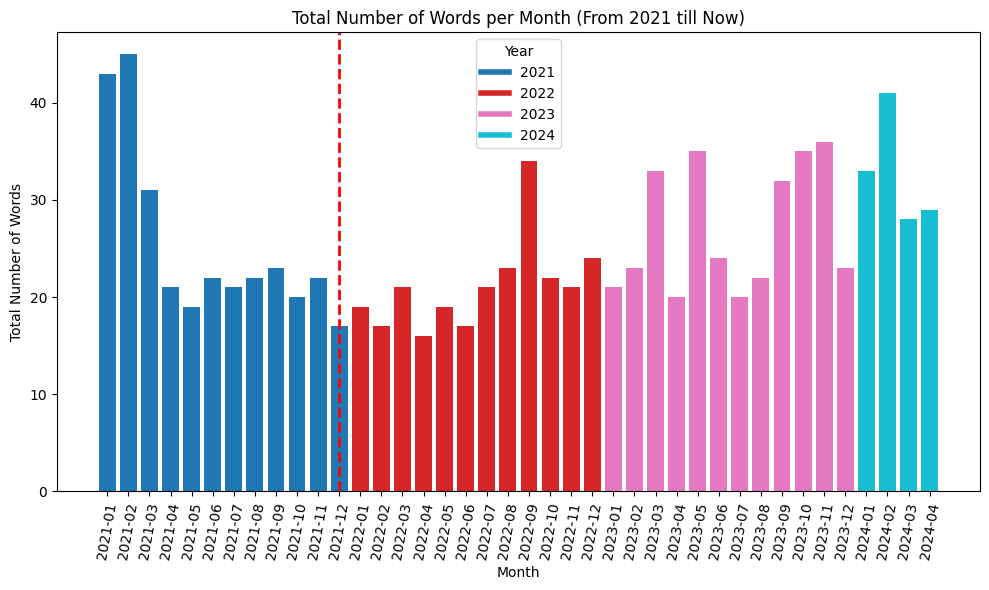

In [12]:
df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

# Filter the DataFrame to only include dates from 2021 to now
df_filtered = df_cleaned[(df_cleaned['date'] >= '2021-01-01') & (df_cleaned['date'] <= pd.Timestamp.today())]

# Group by month and count entries
df_grouped_words = df_filtered.groupby(pd.Grouper(key='date', freq='M')).size()

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Assign colors to each year
years = df_grouped_words.index.year
unique_years = years.unique()
colors = plt.get_cmap('tab10', len(unique_years))

# Plot each bar with the corresponding color
bars = []
for i, (date, count) in enumerate(df_grouped_words.items()):
    color = colors(unique_years.tolist().index(date.year))
    bars.append(ax.bar(i, count, color=color))

# Set x-ticks
ax.set_xticks(range(len(df_grouped_words)))
ax.set_xticklabels([date.strftime('%Y-%m') for date in df_grouped_words.index], rotation=80)

# Create a custom legend
handles = [plt.Line2D([0], [0], color=colors(i), lw=4) for i in range(len(unique_years))]
labels = unique_years
ax.legend(handles, labels, title='Year')

# Add vertical line for December 2021
start_month_index = df_grouped_words.index.get_loc('2021-12-31')
ax.axvline(x=start_month_index, color='red', linestyle='--', linewidth=2, label='Start of Web Traffic Data')

# Title and labels
ax.set_title('Total Number of Words per Month (From 2021 till Now)')
ax.set_xlabel('Month')
ax.set_ylabel('Total Number of Words')

plt.tight_layout()  # Adjust layout to make room for label rotation

# Show the plot
plt.show()


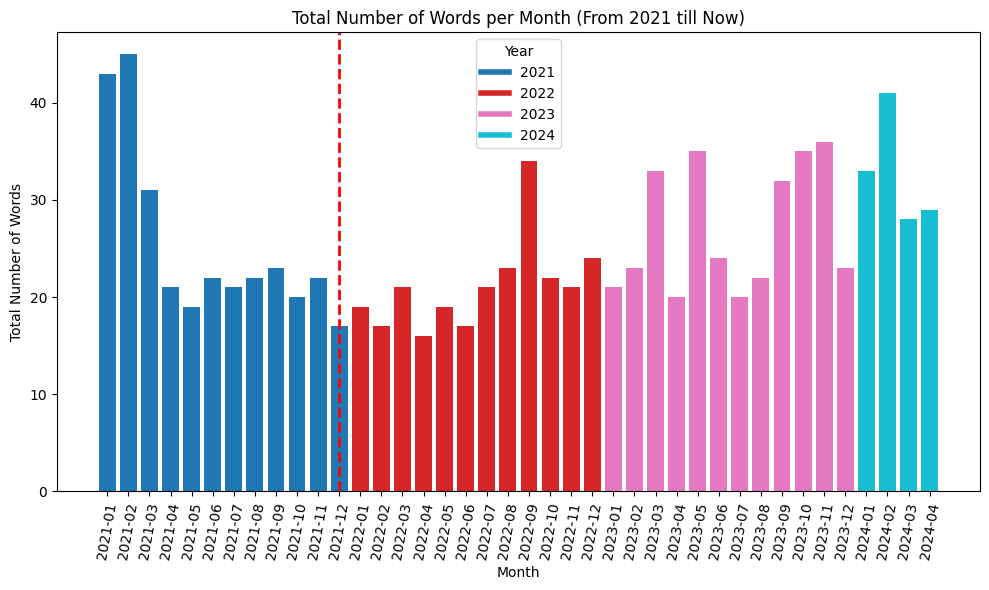

In [13]:
df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

# Filter the DataFrame to only include dates from 2021 to now
df_filtered = df_cleaned[(df_cleaned['date'] >= '2021-01-01') & (df_cleaned['date'] <= pd.Timestamp.today())]

# Group by month and count entries
df_grouped_words = df_filtered.groupby(pd.Grouper(key='date', freq='M')).size()

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Assign colors to each year
years = df_grouped_words.index.year
unique_years = years.unique()
colors = plt.get_cmap('tab10', len(unique_years))

# Plot each bar with the corresponding color
bars = []
for i, (date, count) in enumerate(df_grouped_words.items()):
    color = colors(unique_years.tolist().index(date.year))
    bars.append(ax.bar(i, count, color=color))

# Set x-ticks
ax.set_xticks(range(len(df_grouped_words)))
ax.set_xticklabels([date.strftime('%Y-%m') for date in df_grouped_words.index], rotation=80)

# Create a custom legend
handles = [plt.Line2D([0], [0], color=colors(i), lw=4) for i in range(len(unique_years))]
labels = unique_years
ax.legend(handles, labels, title='Year')

# Add vertical line for December 2021
start_month_index = df_grouped_words.index.get_loc('2021-12-31')
ax.axvline(x=start_month_index, color='red', linestyle='--', linewidth=2, label='Start of Web Traffic Data')

# Title and labels
ax.set_title('Total Number of Words per Month (From 2021 till Now)')
ax.set_xlabel('Month')
ax.set_ylabel('Total Number of Words')

plt.tight_layout()
plt.show()

In [14]:
# Convert the 'date' column to datetime if not already
df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

# Filter the DataFrame to only include dates from 2021 to now
df_filtered = df_cleaned[(df_cleaned['date'] >= '2021-01-01') & (df_cleaned['date'] <= pd.Timestamp.today())]

# Group by month and calculate the average word count
df_grouped_avg_words = df_filtered.groupby(pd.Grouper(key='date', freq='M'))['word_count'].mean()

# Verify the grouped data
df_grouped_avg_words.head()


date
2021-01-31    587.976744
2021-02-28    589.422222
2021-03-31    562.838710
2021-04-30    533.666667
2021-05-31    506.263158
Freq: ME, Name: word_count, dtype: float64

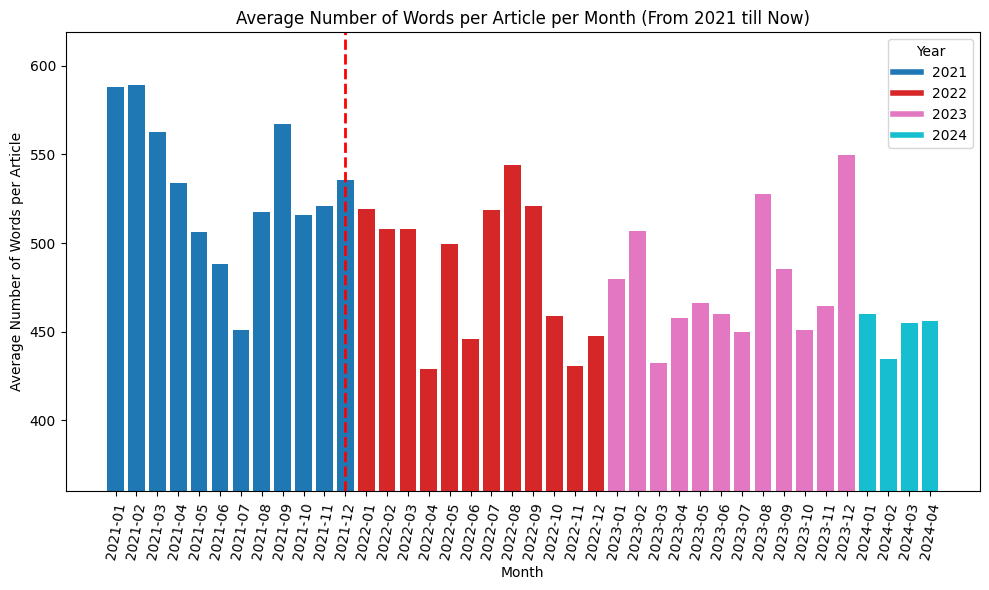

In [15]:
df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

# Filter the DataFrame to only include dates from 2021 to now
df_filtered = df_cleaned[(df_cleaned['date'] >= '2021-01-01') & (df_cleaned['date'] <= pd.Timestamp.today())]

# Calculate the average number of words per article per month
df_filtered['word_count'] = df_filtered['combined_text'].apply(lambda x: len(str(x).split()))
df_grouped_avg_words = df_filtered.groupby(pd.Grouper(key='date', freq='M'))['word_count'].mean()

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Assign colors to each year
years = df_grouped_avg_words.index.year
unique_years = years.unique()
colors = plt.get_cmap('tab10', len(unique_years))

# Plot each bar with the corresponding color
bars = []
for i, (date, count) in enumerate(df_grouped_avg_words.items()):
    color = colors(unique_years.tolist().index(date.year))
    bars.append(ax.bar(i, count, color=color))

# Set x-ticks
ax.set_xticks(range(len(df_grouped_avg_words)))
ax.set_xticklabels([date.strftime('%Y-%m') for date in df_grouped_avg_words.index], rotation=80)

# Create a custom legend
handles = [plt.Line2D([0], [0], color=colors(i), lw=4) for i in range(len(unique_years))]
labels = unique_years
ax.legend(handles, labels, title='Year')

# Add vertical line for December 2021
start_month_index = df_grouped_avg_words.index.get_loc('2021-12-31')
ax.axvline(x=start_month_index, color='red', linestyle='--', linewidth=2, label='Start of Web Traffic Data')

# Title and labels
ax.set_title('Average Number of Words per Article per Month (From 2021 till Now)')
ax.set_xlabel('Month')
ax.set_ylabel('Average Number of Words per Article')

# Set y-axis limit to start from 360
ax.set_ylim(360, ax.get_ylim()[1])

plt.tight_layout()  # Adjust layout to make room for label rotation

# Show the plot
plt.show()


#### TF-IDF

#### Tokenizer

In [16]:
#### nlp component setting #####
porter = SnowballStemmer("english")
stop_words = set(stopwords.words('english'))
# Load spaCy model
sp = spacy.load('en_core_web_sm')

mod = 1

def remove_digits(token):
    # Use regex to remove digits
    token_without_digits = re.sub(r'\d+', '', token)
    return token_without_digits

def abbr_or_lower(word):
    if re.match('([A-Z]+[a-z]*){5,}', word):
        return word
    else:
        return word.lower()
    
def tokenize(text, modulation):
    # Define regex for emojis and "!"
    emoji_exclam_pattern = re.compile(r'[\U0001F600-\U0001F64F\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF\U0001F700-\U0001F77F\U0001F780-\U0001F7FF\U0001F800-\U0001F8FF\U0001F900-\U0001F9FF\U0001FA00-\U0001FA6F\U0001FA70-\U0001FAFF\U00002702-\U000027B0\U000024C2-\U0001F251!]')
    
    tokens = []

    cleaned_text = emoji_exclam_pattern.sub(r'', text)
    if modulation < 3:
        for token in re.split(r'\W+', cleaned_text):
            token = remove_digits(token) # remove number
            if token is '': continue
            token = abbr_or_lower(token)
            if token and re.search('[a-zA-Z]', token):
                if modulation == 0:
                    tokens.append(token)
                elif modulation == 1 and token not in stop_words: # remove stop words
                    tokens.append(token)
                elif modulation == 2 and token not in stop_words and porter: # remove stop words + stem
                    tokens.append(porter.stem(token))
        
        # Handle emojis and "!" separately to avoid removing them
        emoji_exclam_tokens = emoji_exclam_pattern.findall(text)
        for token in emoji_exclam_tokens:
            if token == '!':
                tokens.append(token)
            elif modulation < 2 and token in stop_words:
                continue  # If an emoji is somehow in stop_words, skip it
            else:
                tokens.append(token)
        
    else:
        # Handling for modulation >= 2, potentially using spaCy or other logic
        pass  # Implement as necessary
    
    return tokens

def custom_tokenizer(text):
    tokens = tokenize(text, modulation=mod)
    return tokens

In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer,ngram_range=(1, 3), max_df=0.6, min_df=0.005)

# Fit and transform the cleaned text data
tfidf_features = tfidf_vectorizer.fit_transform(df_cleaned['combined_text'])

# Convert to dense matrix (if needed)
tfidf_features_dense = tfidf_features.toarray()

# Get feature names
feature_names = tfidf_vectorizer.get_feature_names_out()

In [18]:
import numpy as np

# Sum tf-idf scores for each term
term_scores = np.sum(tfidf_features_dense, axis=0)

# Create a dictionary to store terms and their scores
term_score_dict = {term: score for term, score in zip(feature_names, term_scores)}

# Sort terms by their scores in descending order
sorted_terms = sorted(term_score_dict.items(), key=lambda x: x[1], reverse=True)

print("Top 20: ")
# Print the top 100 terms with their scores
for term, score in sorted_terms[:20]:
    print(f"{term}: {score}")


print("\n\nLast 20: ")
# Print the top 100 terms with their scores
for term, score in sorted_terms[-20:]:
    print(f"{term}: {score}")
print("\n\nLength of terms: ",len(term_score_dict))

Top 20: 
deposits: 41.9173305878253
orange: 36.959203088521804
payroll: 36.28350928899117
orange bank: 31.18166427464489
ing: 29.367009020319756
banco: 27.820304316377577
money: 26.224458245480072
renault: 21.979452752191023
renault bank: 21.957361279939967
account apr: 21.894604306546658
term: 21.800400744509723
commissions: 21.21724714058672
wizink: 19.162220671205052
online: 18.991232781334315
deposit apr: 18.82332676268374
year: 18.656687351191323
sabadell: 17.199003597930584
customers: 17.16150087981483
savings: 16.39073281684114
interest: 16.284782857153456


Last 20: 
allow go: 0.2248769777107672
offers checking: 0.22381285457185607
offers checking account: 0.22381285457185607
income self: 0.2231858403052384
income self employed: 0.2231858403052384
free direct: 0.22285526587668902
atm world: 0.22249133796487958
atms withdraw money: 0.22249133796487958
without fees: 0.22030460303127702
one main: 0.21951626297870575
advantages addition: 0.21853984387963665
great advantages: 0.2185

#### 'bank' related terms

In [19]:
import re

patterns = [
    re.compile(r'\b\w+(bank|banco)\w+\b'),                 # Single gram concatenated terms containing "bank" or "banco"
    re.compile(r'\b\w+\s+(bank|banco)\b'),                 # Bigram pattern: ... bank or banco
    re.compile(r'\b(bank|banco)\s+\w+\b'),                 # Bigram pattern: bank or banco ...
    re.compile(r'\b\w+\s+(bank|banco)\s+\w+\b'),           # Trigram pattern: ... bank or banco ...
    re.compile(r'\b(bank|banco)\s+\w+\s+\w+\b'),           # Trigram pattern: bank or banco ... ...
    re.compile(r'\b\w+\s+\w+\s+(bank|banco)\b')            # Trigram pattern: ... ... bank or banco
]


# Dictionary to hold filtered terms
filtered_terms = {}

# Check each term in the dictionary
for term, score in term_score_dict.items():
    # Ensure "bank" or "banco" is standalone
    if any(pattern.match(term) for pattern in patterns) and ('bank' in term.split() or 'banco' in term.split()):
        if score >= 1:
            filtered_terms[term] = score

# Sort the filtered terms by score in descending order
sorted_terms = sorted(filtered_terms.items(), key=lambda x: x[1], reverse=True)
# Print the filtered terms and their scores
for term, score in sorted_terms:
    print(f"Term: {term}, TF-IDF Score: {score:.4f}")

print("\n\nLength of terms: ",len(sorted_terms))

Term: orange bank, TF-IDF Score: 31.1817
Term: renault bank, TF-IDF Score: 21.9574
Term: banco big, TF-IDF Score: 10.2637
Term: bank account, TF-IDF Score: 9.4996
Term: orange bank account, TF-IDF Score: 8.3799
Term: banco sabadell, TF-IDF Score: 8.1938
Term: evo banco, TF-IDF Score: 8.1719
Term: bank either, TF-IDF Score: 7.6710
Term: orange bank either, TF-IDF Score: 7.6076
Term: anyone orange bank, TF-IDF Score: 7.5992
Term: bank account know, TF-IDF Score: 7.5992
Term: bank either atms, TF-IDF Score: 7.5992
Term: surpasses orange bank, TF-IDF Score: 7.5992
Term: ebn banco, TF-IDF Score: 7.2154
Term: apr renault bank, TF-IDF Score: 6.3877
Term: deutsche bank, TF-IDF Score: 5.9212
Term: bank ends, TF-IDF Score: 5.6252
Term: renault bank ends, TF-IDF Score: 5.6252
Term: banco santander, TF-IDF Score: 5.5515
Term: bank increases, TF-IDF Score: 5.2332
Term: apr banco, TF-IDF Score: 5.1096
Term: haitong bank, TF-IDF Score: 4.8312
Term: nn bank, TF-IDF Score: 4.8188
Term: bank offers, TF-

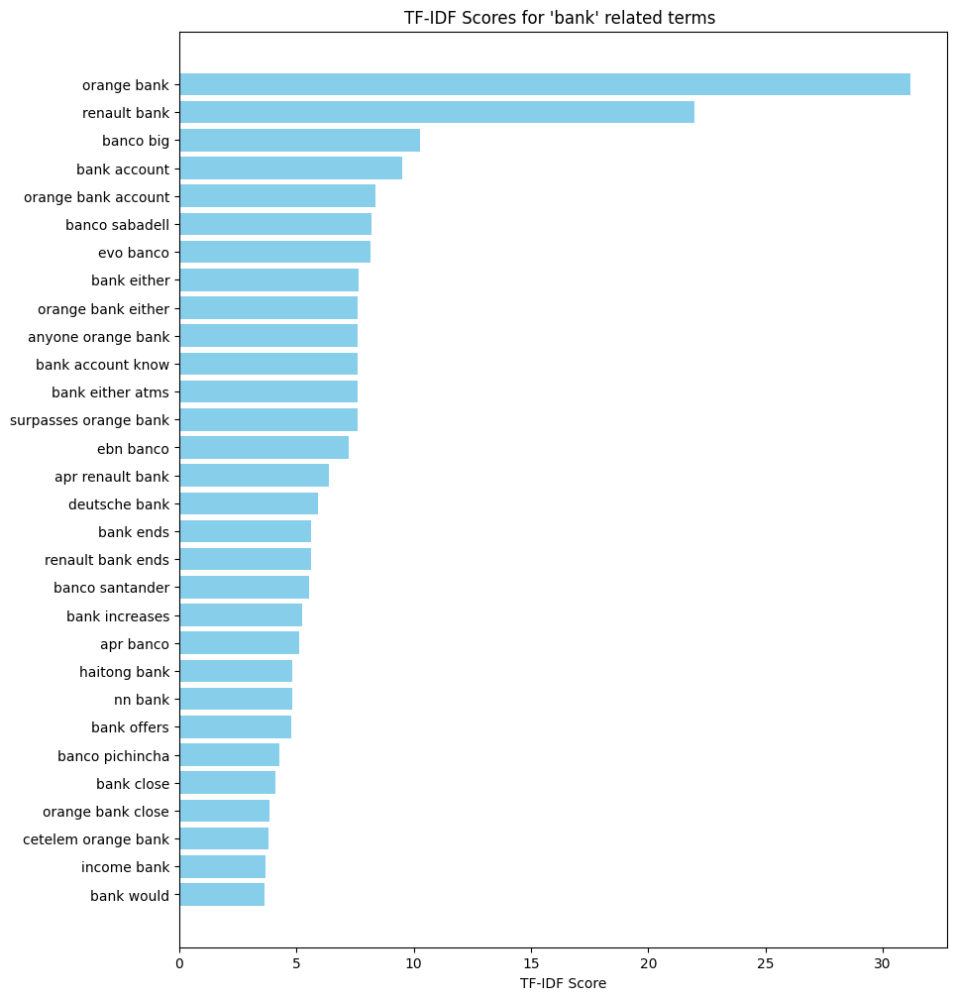

In [20]:
plot_sorted_terms = sorted_terms[:30]
terms, scores = zip(*plot_sorted_terms)

plt.figure(figsize=(10, 12))
plt.barh(terms, scores, color='skyblue')
plt.xlabel('TF-IDF Score')
plt.title('TF-IDF Scores for \'bank\' related terms ')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest scores at the top
plt.show()

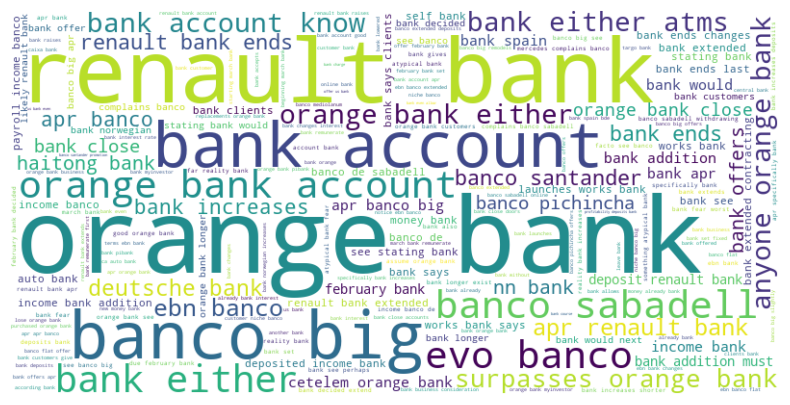

In [21]:
# Converting sorted_terms back to a dictionary
filtered_term_score_dict = dict(sorted_terms)
# Generate the word cloud
wordcloud = WordCloud(
    width = 800, 
    height = 400, 
    background_color = 'white'
).generate_from_frequencies(filtered_term_score_dict)

# Displaying the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')  # 'bilinear' for smoother appearance
plt.axis('off')  # No axis to be shown
plt.show()

Total terms before filtering: 13362
Total terms after filtering: 12415


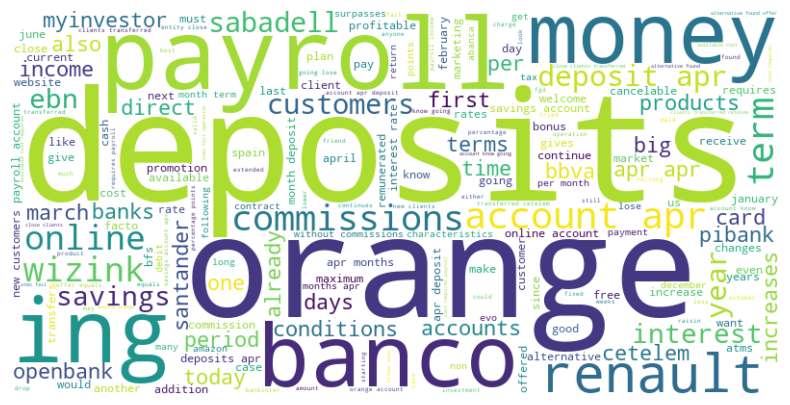

In [22]:
not_bank_filtered_terms = {}

# Check each term in the dictionary
for term, score in term_score_dict.items():
    if not(any(pattern.search(term) for pattern in patterns)):
        not_bank_filtered_terms[term] = score

# Print the number of terms before and after filtering
print(f"Total terms before filtering: {len(term_score_dict)}")
print(f"Total terms after filtering: {len(not_bank_filtered_terms)}")

# Sort the filtered terms by score in descending order
not_bank_sorted_terms = sorted(not_bank_filtered_terms.items(), key=lambda x: x[1], reverse=True)

# Generate the word cloud if there are any terms left after filtering
if not_bank_sorted_terms:
    plot_term_score_dict = dict(not_bank_sorted_terms)
    # Generate the word cloud
    wordcloud = WordCloud(
        width = 800, 
        height = 400, 
        background_color = 'white'
    ).generate_from_frequencies(plot_term_score_dict)

    # Displaying the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')  # 'bilinear' for smoother appearance
    plt.axis('off')  # No axis to be shown
    plt.show()
else:
    print("No terms available to generate a word cloud.")

### yearly tf-idf

In [23]:
df_cleaned['date'] = pd.to_datetime(df_cleaned['date'])

# Extract year from the date
df_cleaned['year'] = df_cleaned['date'].dt.year


In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import re

def compute_tfidf_scores(df, patterns):
    # Initialize TF-IDF vectorizer
    tfidf_vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer, ngram_range=(1, 3), max_df=0.6, min_df=0.005)

    # Fit and transform the cleaned text data
    tfidf_features = tfidf_vectorizer.fit_transform(df['combined_text'])

    # Convert to dense matrix (if needed)
    tfidf_features_dense = tfidf_features.toarray()

    # Get feature names
    feature_names = tfidf_vectorizer.get_feature_names_out()

    # Sum tf-idf scores for each term
    term_scores = np.sum(tfidf_features_dense, axis=0)

    # Create a dictionary to store terms and their scores
    term_score_dict = {term: score for term, score in zip(feature_names, term_scores)}

    # Dictionary to hold filtered terms
    filtered_terms = {}

    # Check each term in the dictionary
    for term, score in term_score_dict.items():
        # Ensure "bank" or "banco" is standalone
        if any(pattern.match(term) for pattern in patterns) and ('bank' in term.split() or 'banco' in term.split()):
            if score >= 0.5:
                filtered_terms[term] = score

    # Sort the filtered terms by score in descending order
    sorted_terms = sorted(filtered_terms.items(), key=lambda x: x[1], reverse=True)

    return sorted_terms

patterns = [
    re.compile(r'\b\w*(bank|banco)\w*\b'),                 # Single gram concatenated terms containing "bank" or "banco"
    re.compile(r'\b\w+\s+(bank|banco)\b'),                 # Bigram pattern: ... bank or banco
    re.compile(r'\b(bank|banco)\s+\w+\b'),                 # Bigram pattern: bank or banco ...
    re.compile(r'\b\w+\s+(bank|banco)\s+\w+\b'),           # Trigram pattern: ... bank or banco ...
    re.compile(r'\b(bank|banco)\s+\w+\s+\w+\b'),           # Trigram pattern: bank or banco ... ...
    re.compile(r'\b\w+\s+\w+\s+(bank|banco)\b')            # Trigram pattern: ... ... bank or banco
]

# Group by year and compute TF-IDF scores for each year
yearly_tfidf_scores = {}
for year, group in df_cleaned.groupby('year'):
    yearly_tfidf_scores[year] = compute_tfidf_scores(group, patterns)


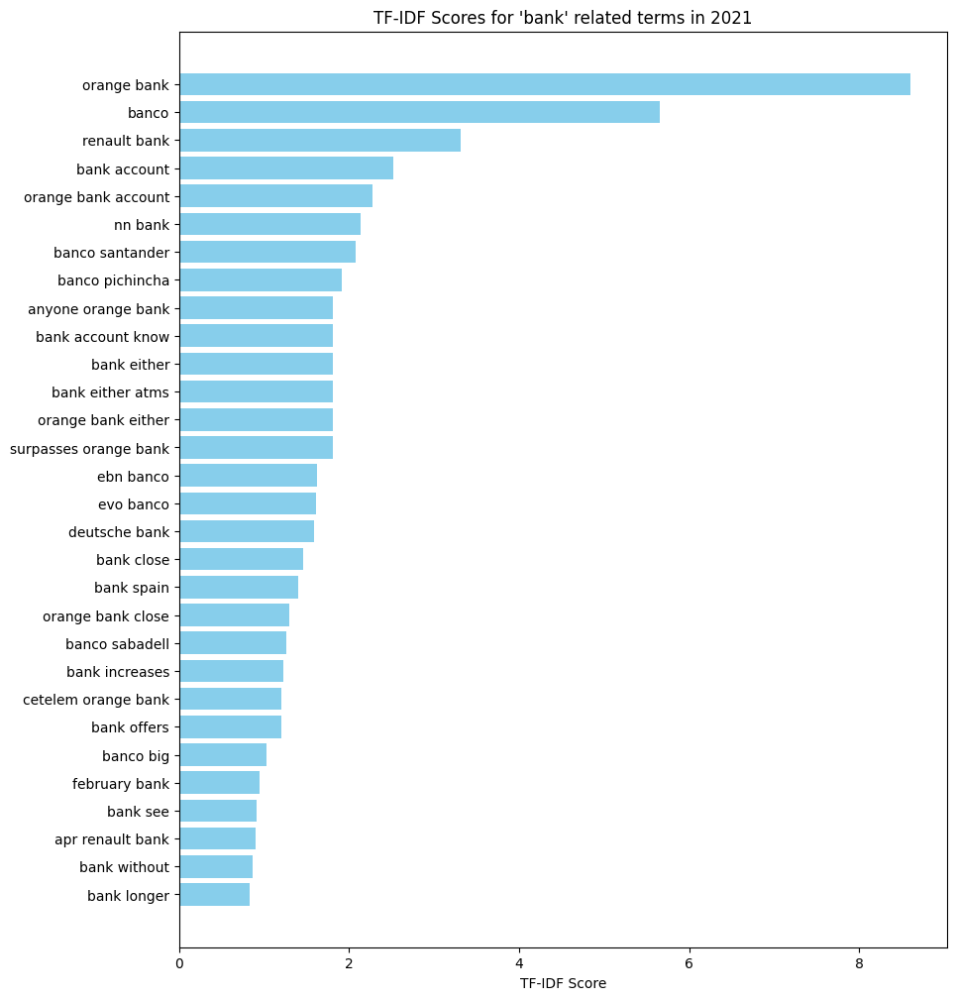

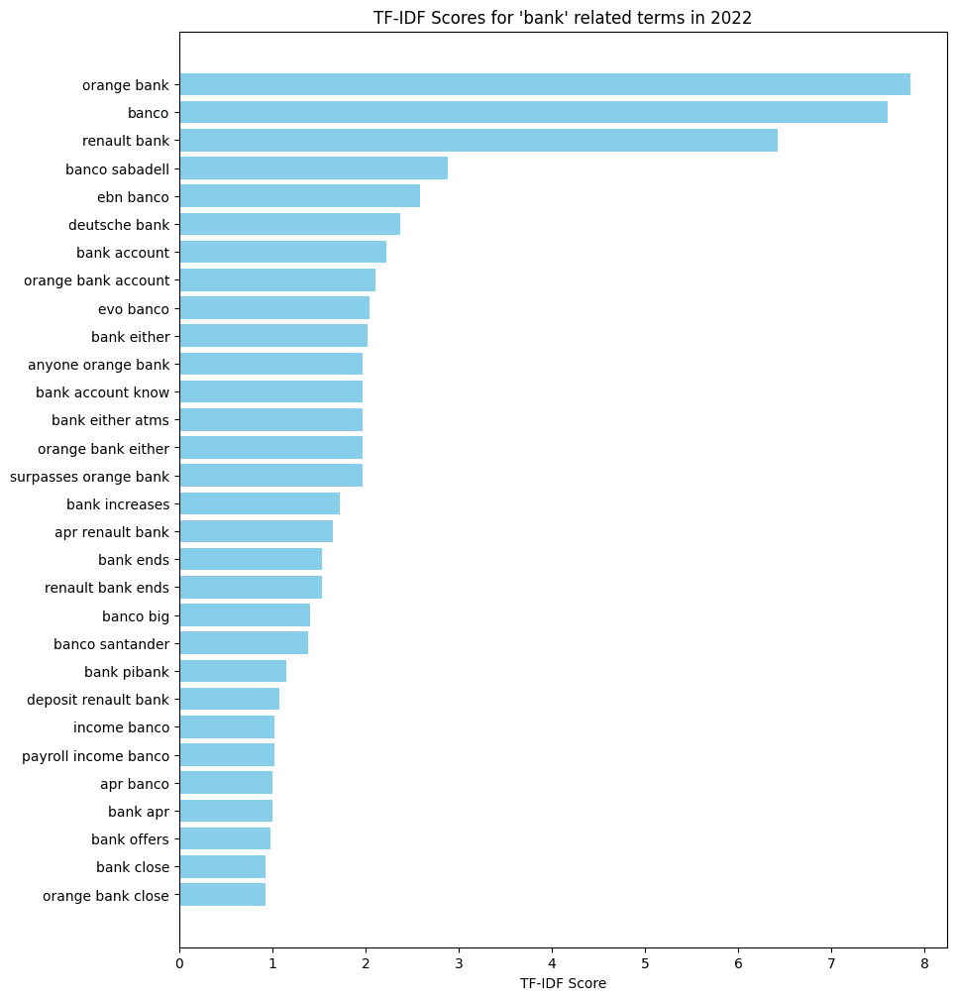

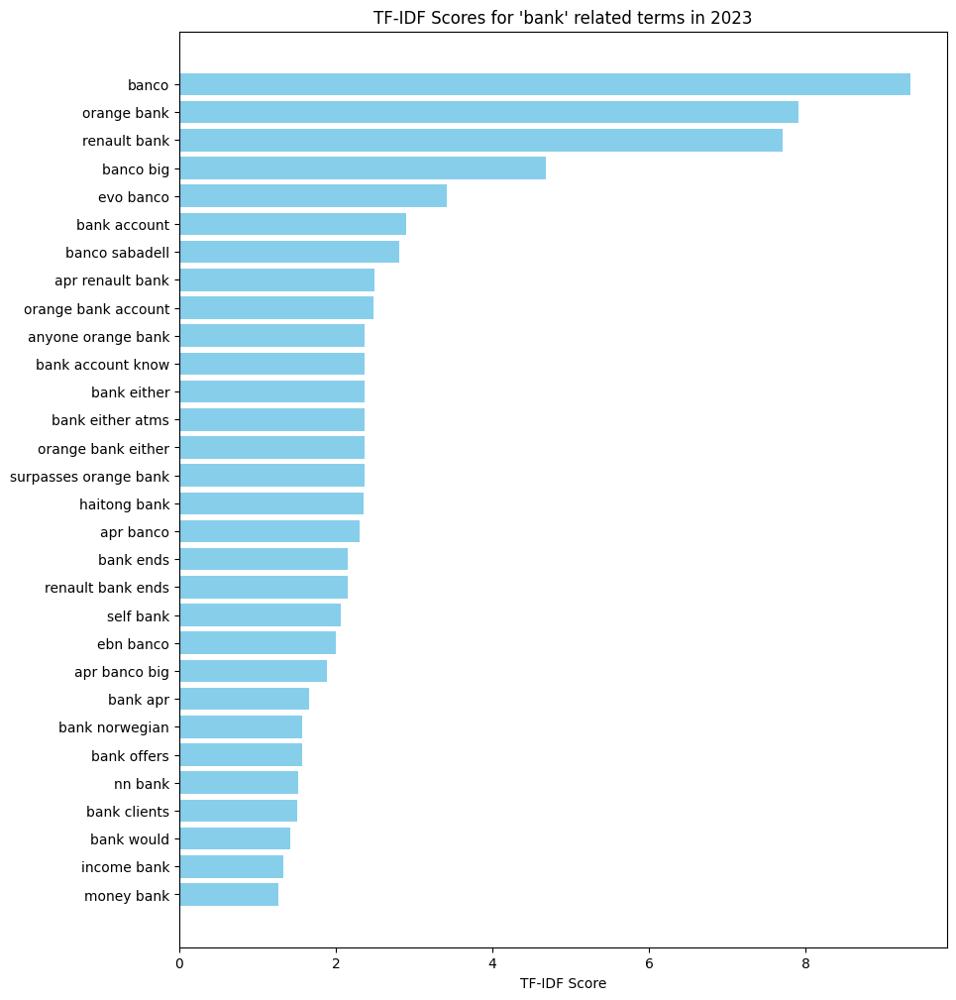

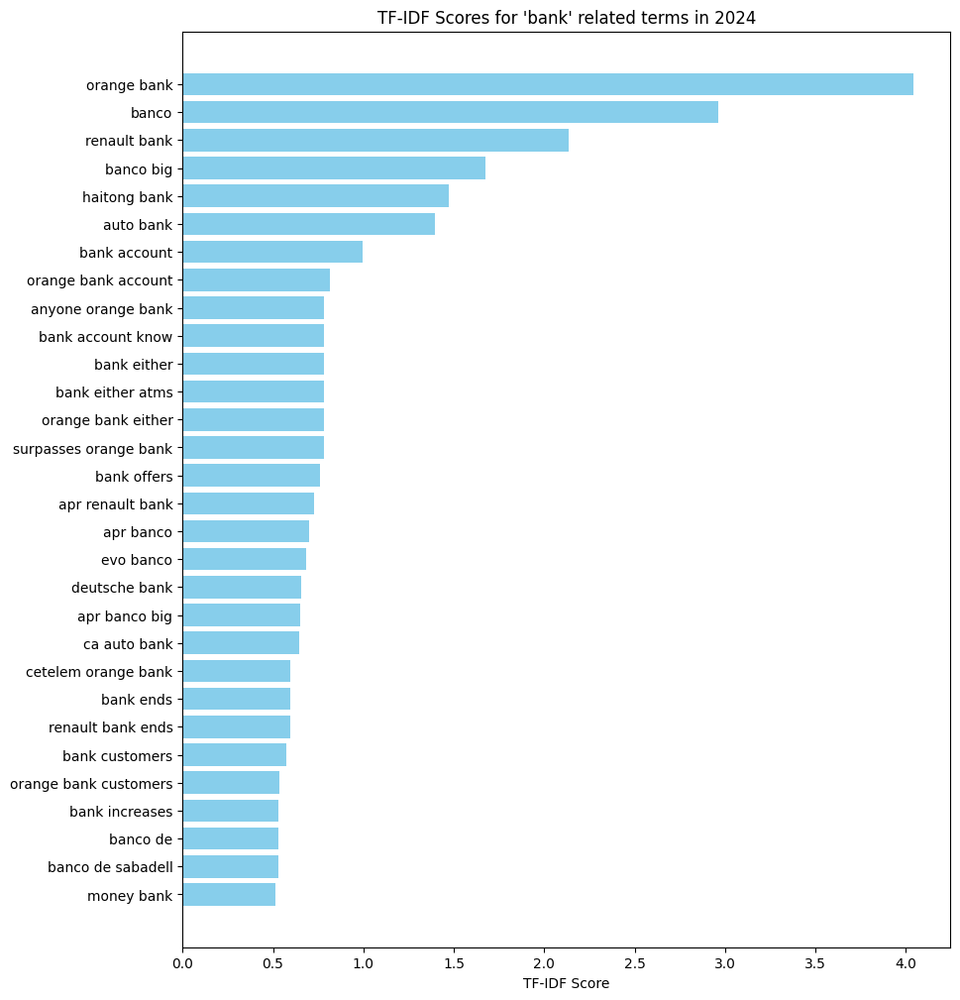

In [25]:
filtered_yearly_tfidf_scores = {year: terms for year, terms in yearly_tfidf_scores.items() if terms}

for year, sorted_terms in filtered_yearly_tfidf_scores.items():
    plot_sorted_terms = sorted_terms[:30]  # Adjust number of terms to plot as needed
    terms, scores = zip(*plot_sorted_terms)

    plt.figure(figsize=(10, 12))
    plt.barh(terms, scores, color='skyblue')
    plt.xlabel('TF-IDF Score')
    plt.title(f'TF-IDF Scores for \'bank\' related terms in {year}')
    plt.gca().invert_yaxis()  # Invert y-axis to have the highest scores at the top
    plt.show()

#### LDA - topic modelling

In [26]:
'''from collections.abc import Mapping
from gensim import corpora, models
import pprint
'''

'from collections.abc import Mapping\nfrom gensim import corpora, models\nimport pprint\n'

In [27]:
'''#!pip install gensim
!pip install --use-pep517 gensim==3.8.0
!pip install scipy==1.10.1'''

'#!pip install gensim\n!pip install --use-pep517 gensim==3.8.0\n!pip install scipy==1.10.1'

In [28]:
def tokenizer_for_df(text, mod = 0):
    tokens = tokenize(text, mod)
    return " ".join(tokens)

def load_bar(corpus_data, col, mod = 0):
    # Percentage load bar
    text_preproc = corpus_data[col].astype(str).progress_apply(lambda row: tokenizer_for_df(row, mod))
    corpus_data[col] = text_preproc
    print(f'done with column: {col}')


def tokenizer_for_df_fit(corpus_data, mod = 0):
    # Load with bar and requires a mod value
    load_bar(corpus_data, "combined_text", mod)

    corpus_data = corpus_data.dropna(subset=["combined_text"]).reset_index(drop=True)
    corpus_data = corpus_data[["title", "url", "date", "text", "combined_text", "word_count"]]

    return corpus_data

In [29]:
df_copy = df_cleaned
df_copy = tokenizer_for_df_fit(df_copy,mod = 1)

df_copy.head()

100%|██████████| 1018/1018 [00:01<00:00, 714.84it/s]

done with column: combined_text


,title,url,date,text,combined_text,word_count
0,"Tomorrow, last day of the account at 2.89% APR...",https://www.tucapital.es/depositos/manana-ulti...,2024-04-23,"Tomorrow, April 24, 2024, the marketing period...",tomorrow last day account apr deposit apr rena...,318
1,ING gives you up to €120 if you direct your pa...,https://www.tucapital.es/cuentas/ing-te-da-has...,2024-04-22,"ING now asks, in addition to direct debiting a...",ing gives direct payroll pay card ing gives di...,400
2,Banco BIG deposits: slight increase in normal ...,https://www.tucapital.es/depositos/depositos-d...,2024-04-22,Banco BIG remodels its deposit offer with slig...,banco big deposits slight increase normal comb...,476
3,The future of Bitcoin: predictions for the nex...,https://www.tucapital.es/blogs/guias/el-futuro...,2024-04-22,"Since its launch, Bitcoin has seen positive an...",future bitcoin predictions next years future b...,656
4,Eco: Cetelem only allows maximum daily transfe...,https://www.tucapital.es/blogs/eco/eco-cetelem...,2024-04-19,"Due to the disappearance of Orange Bank, and t...",eco cetelem allows maximum daily transfers eco...,450


In [30]:
#pip install "scipy<1.13"

In [31]:
def custom_tokenizer_mod_1(text):
    tokens = tokenize(text, modulation=1)
    return tokens

from gensim import corpora, models
import pprint

# Tokenize the documents
tokenized_documents = df_copy['combined_text'].apply(custom_tokenizer_mod_1).tolist()

# Create dictionary and corpus
dictionary = corpora.Dictionary(tokenized_documents)
corpus = [dictionary.doc2bow(doc) for doc in tokenized_documents]

# Train the LDA model
lda_model = models.LdaModel(corpus, num_topics= 15, id2word=dictionary)

# Print the topics
pprint.pprint(lda_model.print_topics())

[(0,
  '0.025*"bank" + 0.018*"account" + 0.011*"card" + 0.010*"apr" + '
  '0.010*"clients" + 0.008*"money" + 0.007*"new" + 0.007*"months" + '
  '0.007*"entity" + 0.006*"month"'),
 (1,
  '0.038*"apr" + 0.038*"account" + 0.021*"bank" + 0.017*"deposit" + '
  '0.014*"month" + 0.010*"without" + 0.010*"clients" + 0.010*"banco" + '
  '0.009*"payroll" + 0.008*"months"'),
 (2,
  '0.036*"bank" + 0.022*"apr" + 0.017*"account" + 0.010*"clients" + '
  '0.009*"money" + 0.008*"new" + 0.008*"deposits" + 0.008*"months" + '
  '0.007*"orange" + 0.007*"ing"'),
 (3,
  '0.023*"bank" + 0.019*"account" + 0.012*"apr" + 0.010*"deposit" + '
  '0.008*"payroll" + 0.008*"month" + 0.007*"online" + 0.007*"per" + '
  '0.006*"offer" + 0.006*"also"'),
 (4,
  '0.051*"apr" + 0.034*"bank" + 0.032*"account" + 0.017*"orange" + '
  '0.012*"deposit" + 0.010*"offers" + 0.010*"offer" + 0.009*"profitability" + '
  '0.009*"money" + 0.009*"new"'),
 (5,
  '0.021*"bank" + 0.009*"apr" + 0.008*"money" + 0.007*"new" + 0.006*"clients" '


##### when we only lower-case and remove digits, interesting part appears, importance of emojs appeared in some topics and even appeared at top6, (9, '0.080*"!" + 0.037*"to" + 0.033*"very" + 0.033*"beautiful" + 0.032*"do" + ' '0.028*"a" + 0.025*"\👍" + 0.025*"nice" + 0.019*"experience" + 0.019*"queues"'). As we didn't remove stop words, too much confusing-information appears.</br>

#### We will use remove stop-words and do stemming for join purpose for next LDA analysis.

In [49]:
# Using get_document_topics with an explicit minimum_probability
doc_topics = [lda_model.get_document_topics(item, minimum_probability=0.0000001) for item in corpus]

#note you could also use this vector = [lda[item] for item in corpus] but this has a higher threshold. 
#I like my topic vectors complete!

#this produces a lits of tuples
print(doc_topics[0])

[(0, 0.00042741362), (1, 0.0004274142), (2, 0.0004274138), (3, 0.0004274137), (4, 0.29706895), (5, 0.00042741353), (6, 0.00042741394), (7, 0.0004274138), (8, 0.00042741356), (9, 0.00042741385), (10, 0.0004274138), (11, 0.54414153), (12, 0.00042741367), (13, 0.1536606), (14, 0.0004274138)]


We observed that for 1st review, review relevance to most topics are very small, all around than 0.011112. Probably because small topics number, but we should allow this happened, as our reviews number is large but short for each.

In [33]:
topics = lda_model.show_topics(num_topics=-1, num_words=50, formatted=False)
topics

[(0,
  [('bank', 0.02484483),
   ('account', 0.017678076),
   ('card', 0.011141826),
   ('apr', 0.010472252),
   ('clients', 0.009829298),
   ('money', 0.007514532),
   ('new', 0.007447795),
   ('months', 0.007129072),
   ('entity', 0.006810213),
   ('month', 0.006393738),
   ('wizink', 0.005977907),
   ('offer', 0.0057749813),
   ('deposit', 0.0056102145),
   ('amazon', 0.005592946),
   ('commissions', 0.005117822),
   ('orange', 0.005054309),
   ('ing', 0.004965405),
   ('days', 0.0047119865),
   ('see', 0.0045308396),
   ('without', 0.0045286887),
   ('check', 0.0044335807),
   ('savings', 0.004428167),
   ('also', 0.004250781),
   ('time', 0.0042318106),
   ('payment', 0.0039434424),
   ('free', 0.0039426186),
   ('one', 0.00387713),
   ('payroll', 0.0038195555),
   ('banco', 0.0037858766),
   ('receive', 0.0037572677),
   ('conditions', 0.003612374),
   ('want', 0.0035946174),
   ('must', 0.0034916743),
   ('pay', 0.0034826137),
   ('income', 0.0034213336),
   ('make', 0.003393236

In [34]:
#!pip install emojis

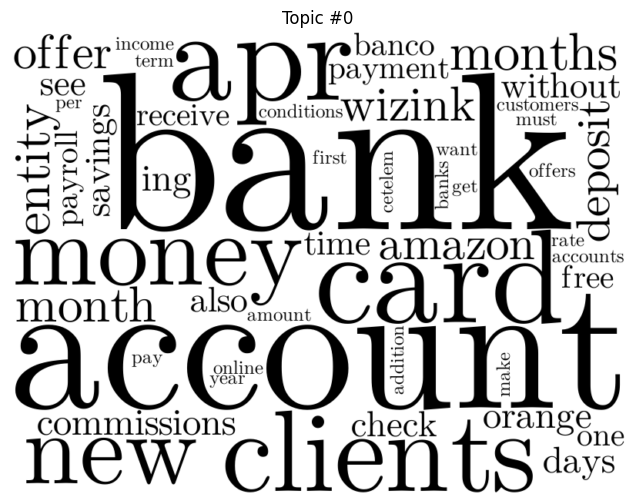

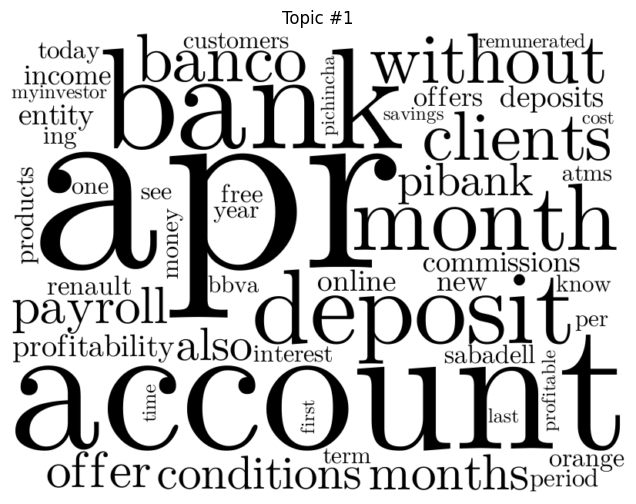

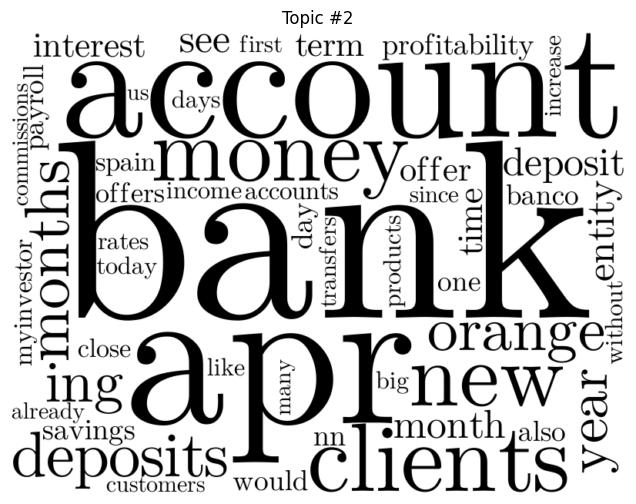

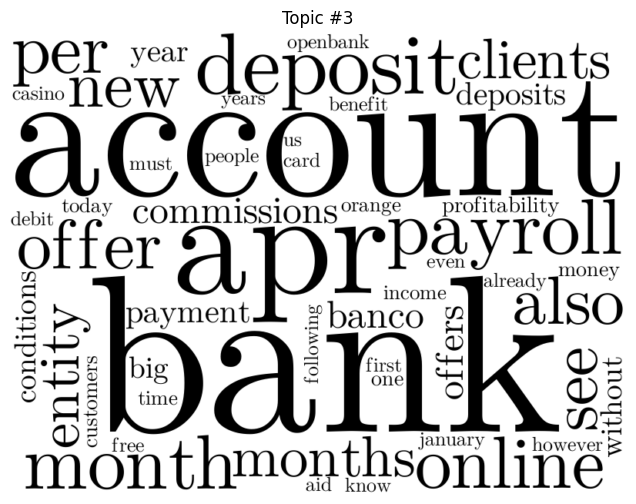

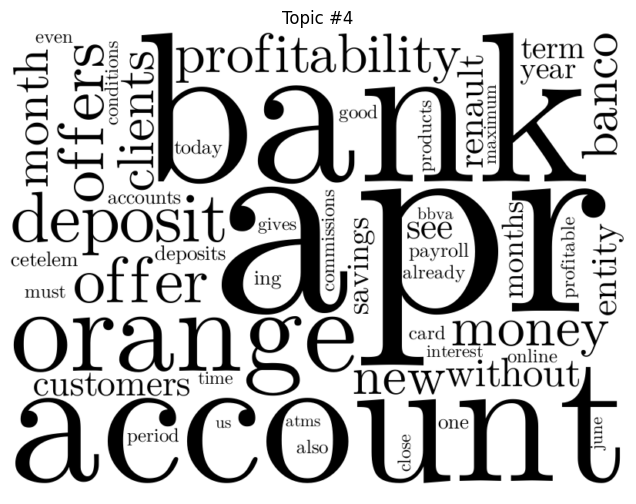

...

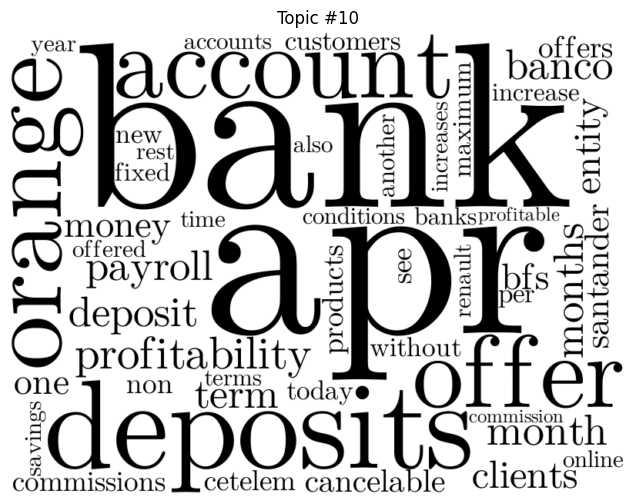

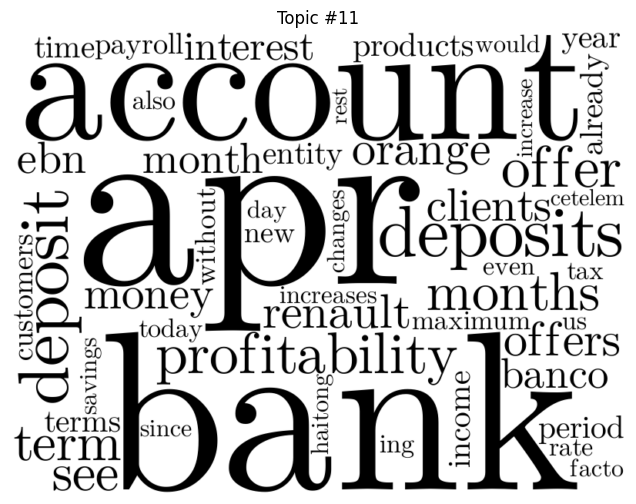

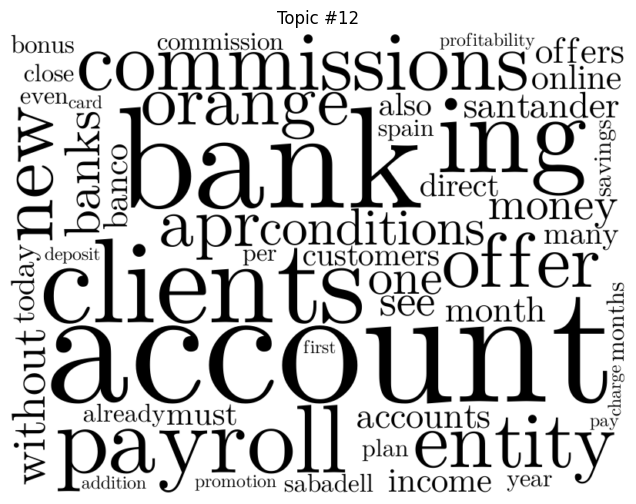

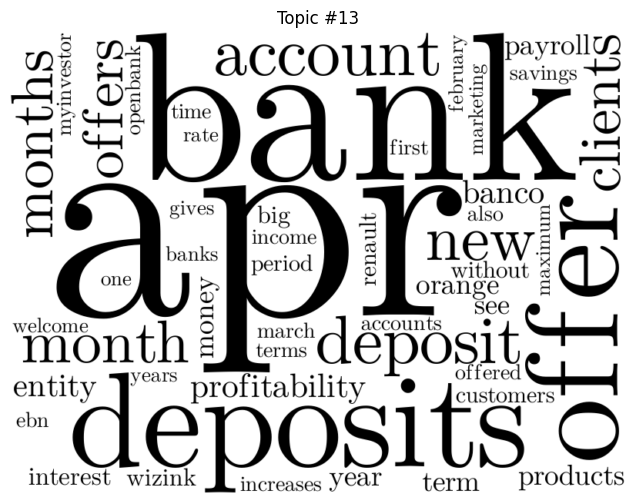

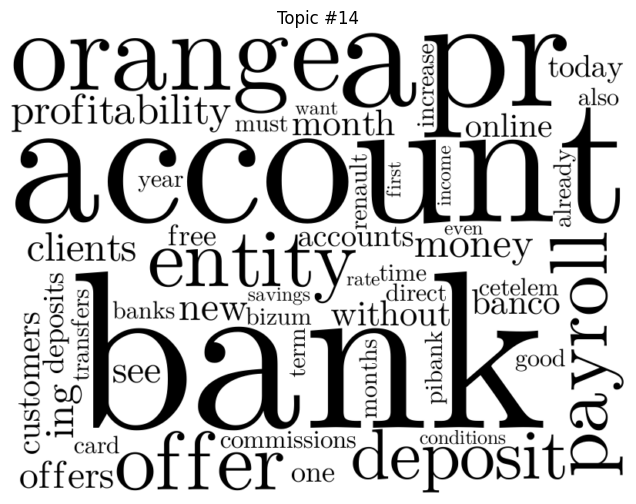

In [35]:
from wordcloud import WordCloud
import emojis

# Define a font path that supports emojis
font_path = 'D:/Hangze Wu/BSE/DSDM/semester3/Master Thesis/github_thesis/deloitte_digital_banking/tucapital_scraper/emoj_Symbola/Symbola.otf'

def generate_wordclouds(topics, dictionary,font_path):
    for topic_num, topic_words in topics:
        word_freq = dict(topic_words)
        wordcloud = WordCloud(
            width=800,
            height=600,
            background_color='white',
            color_func=lambda *args, **kwargs: "black",  # Default color for non-emojis
            font_path=font_path,  # Specify emoji support
            min_font_size=10,
            regexp=r"\S+",  # Regular expression to include all non-whitespace characters
        ).generate_from_frequencies(word_freq)
        
        # Define a custom color function for emojis
        def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
            if word in emojis.UNICODE_EMOJI:  # Check if the word is an emoji
                return "lightblue"  # Set color for emojis
            else:
                return "black"  # Default color for non-emojis
        
        # Apply the custom color function
        wordcloud.color_func = color_func
        
        plt.figure(figsize=(8, 6), facecolor=None)
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f'Topic #{topic_num}')
        plt.show()

# Generate word clouds for each topic
generate_wordclouds(topics, lda_model.id2word,font_path)

In [36]:
def custom_tokenizer_mod_1(text):
    tokens = tokenize(text, modulation=1)
    return tokens

from gensim import corpora, models
import pprint

# Tokenize the documents
tokenized_documents_mod1 = df_copy['combined_text'].apply(custom_tokenizer_mod_1).tolist()

# Create dictionary and corpus
dictionary_mod1 = corpora.Dictionary(tokenized_documents_mod1)
corpus_mod1 = [dictionary_mod1.doc2bow(doc) for doc in tokenized_documents_mod1]

# Train the LDA model
lda_model_mod1_topics_5 = models.LdaModel(corpus_mod1, num_topics= 5, id2word=dictionary_mod1)

# Print the topics
pprint.pprint(lda_model_mod1_topics_5.print_topics())

[(0,
  '0.025*"bank" + 0.024*"account" + 0.019*"apr" + 0.015*"offer" + '
  '0.014*"orange" + 0.010*"clients" + 0.010*"deposits" + 0.010*"new" + '
  '0.010*"offers" + 0.008*"profitability"'),
 (1,
  '0.020*"bank" + 0.016*"account" + 0.015*"apr" + 0.009*"new" + '
  '0.009*"payroll" + 0.007*"orange" + 0.007*"offer" + 0.006*"money" + '
  '0.006*"see" + 0.006*"clients"'),
 (2,
  '0.053*"apr" + 0.023*"bank" + 0.020*"account" + 0.015*"deposit" + '
  '0.014*"month" + 0.012*"deposits" + 0.011*"new" + 0.009*"clients" + '
  '0.009*"offer" + 0.009*"payroll"'),
 (3,
  '0.034*"bank" + 0.032*"apr" + 0.030*"account" + 0.013*"deposit" + '
  '0.012*"clients" + 0.011*"deposits" + 0.010*"orange" + 0.010*"offer" + '
  '0.009*"payroll" + 0.009*"money"'),
 (4,
  '0.027*"apr" + 0.020*"bank" + 0.015*"account" + 0.010*"money" + '
  '0.010*"deposits" + 0.009*"offer" + 0.009*"payroll" + 0.009*"clients" + '
  '0.008*"orange" + 0.008*"month"')]


### when we remove stop words and do stemming, importance of emojs in each topics is decreased and less than words. But, after removing stop words and do stemming, tokens in each topics give a better explanation

In [37]:
# Using get_document_topics with an explicit minimum_probability
doc_topics_mod1 = [lda_model_mod1_topics_5.get_document_topics(item, minimum_probability=0.0000001) for item in corpus_mod1]

#note you could also use this vector = [lda[item] for item in corpus] but this has a higher threshold. 
#I like my topic vectors complete!

#this produces a lits of tuples
print(doc_topics_mod1[0])

[(0, 0.0013047077), (1, 0.0013001069), (2, 0.99477726), (3, 0.0013125873), (4, 0.0013053085)]


In [57]:
topics_mod1 = lda_model_mod1_topics_5.show_topics(num_topics=-1, num_words=50, formatted=False)
topics_mod1

[(0,
  [('bank', 0.02459593),
   ('account', 0.023918256),
   ('apr', 0.019297466),
   ('offer', 0.014623343),
   ('orange', 0.014139986),
   ('clients', 0.009726721),
   ('deposits', 0.009645522),
   ('new', 0.009595951),
   ('offers', 0.009522767),
   ('profitability', 0.007901149),
   ('entity', 0.0077283555),
   ('money', 0.0072730193),
   ('see', 0.0071236915),
   ('months', 0.0070287767),
   ('month', 0.0068496154),
   ('payroll', 0.006376327),
   ('without', 0.006242154),
   ('banco', 0.0060381056),
   ('also', 0.0058076642),
   ('commissions', 0.005527279),
   ('one', 0.0048057693),
   ('conditions', 0.0045564803),
   ('cetelem', 0.004457511),
   ('year', 0.0044096736),
   ('online', 0.0043994677),
   ('card', 0.0043721027),
   ('deposit', 0.004311697),
   ('customers', 0.004241061),
   ('already', 0.004115461),
   ('interest', 0.0041041654),
   ('term', 0.004015433),
   ('first', 0.0039667278),
   ('accounts', 0.0038645966),
   ('good', 0.0037753405),
   ('cost', 0.0037016387)

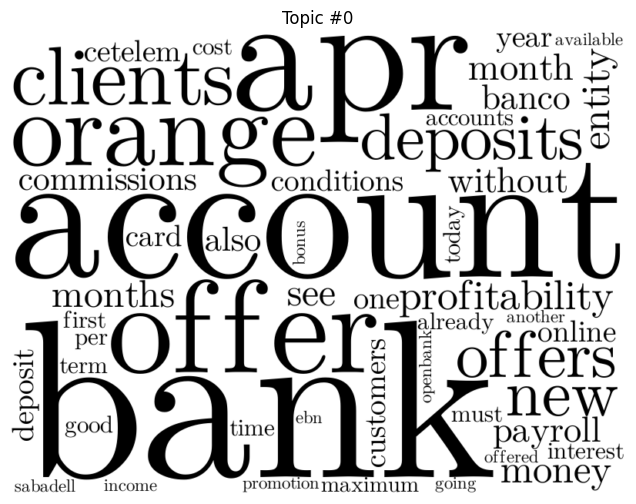

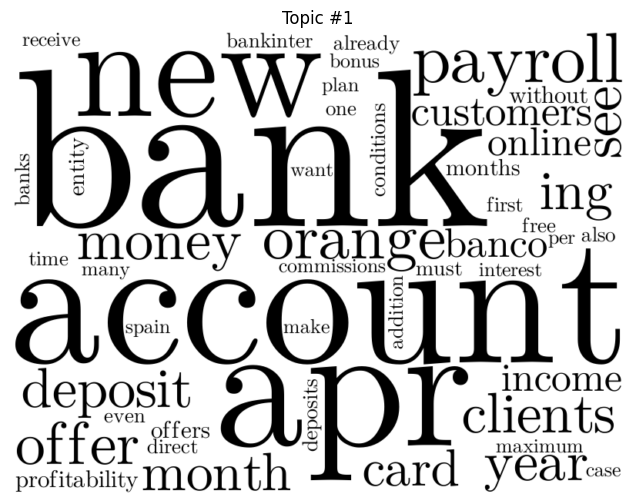

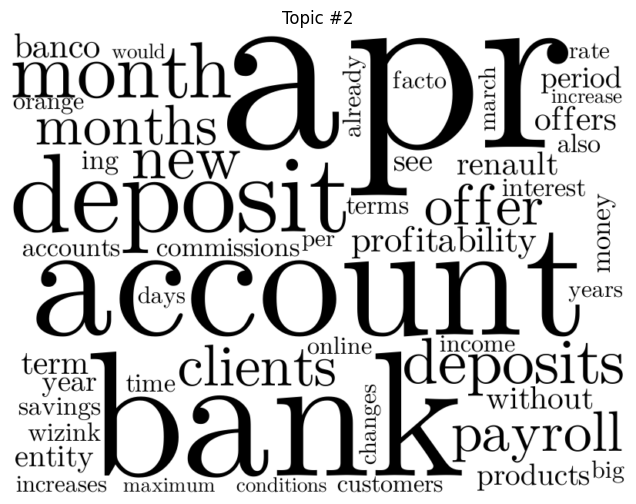

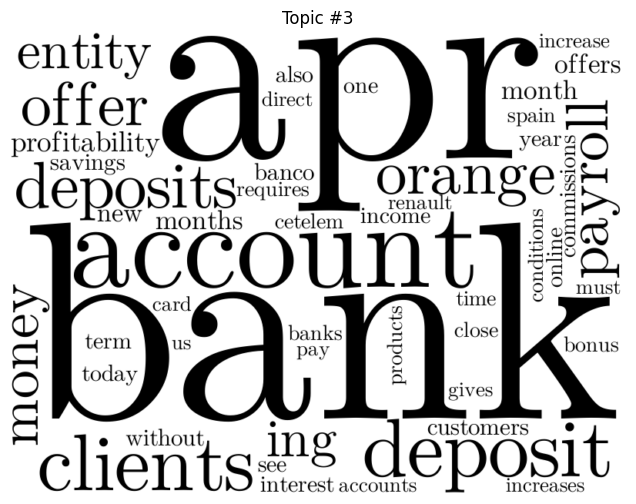

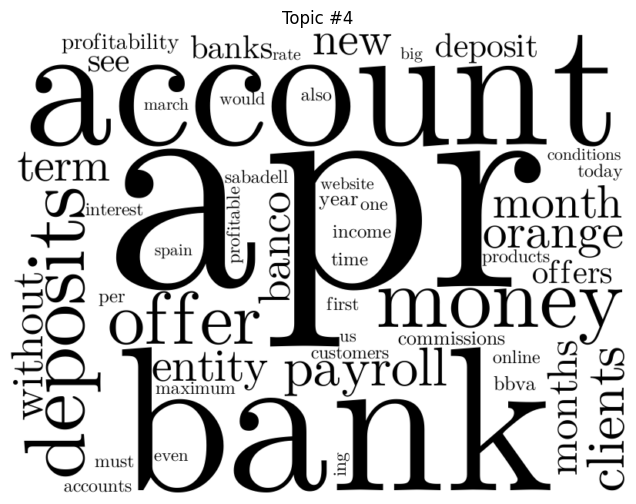

In [39]:
font_path = 'D:/Hangze Wu/BSE/DSDM/semester3/Master Thesis/github_thesis/deloitte_digital_banking/tucapital_scraper/emoj_Symbola/Symbola.otf'
generate_wordclouds(topics_mod1, lda_model_mod1_topics_5.id2word,font_path)

             0          1          2          3          4          5   \
2024   1.576012   5.625027   0.551424   3.313656  10.781901   7.597507   
2023   4.124852  14.060975   6.015324   6.283838  40.275482   8.019647   
2022  10.793803  21.588523   1.476310   6.423228  21.123347  10.893652   
2021  12.779141  25.886961  10.853388  14.961925  12.262393  14.111308   
2020   0.000856   0.022180   0.277984   0.000856   0.000856   0.000856   

             6          7          8          9         10         11  \
2024   9.740387  14.227403   3.183901  13.121836  5.258831  19.668327   
2023  34.982875  28.816795   2.951220  41.958769  9.200921  30.057444   
2022  15.941994  38.576326   8.942736  24.259887  8.201043  20.772231   
2021  21.862573  49.477024  19.453491  21.056634  7.802844  14.802859   
2020   0.000856   0.608169   0.000856   0.622444  0.000856   0.000856   

             12         13         14  
2024   1.579957  27.195436   7.578395  
2023  13.981602  78.121873   5.14838

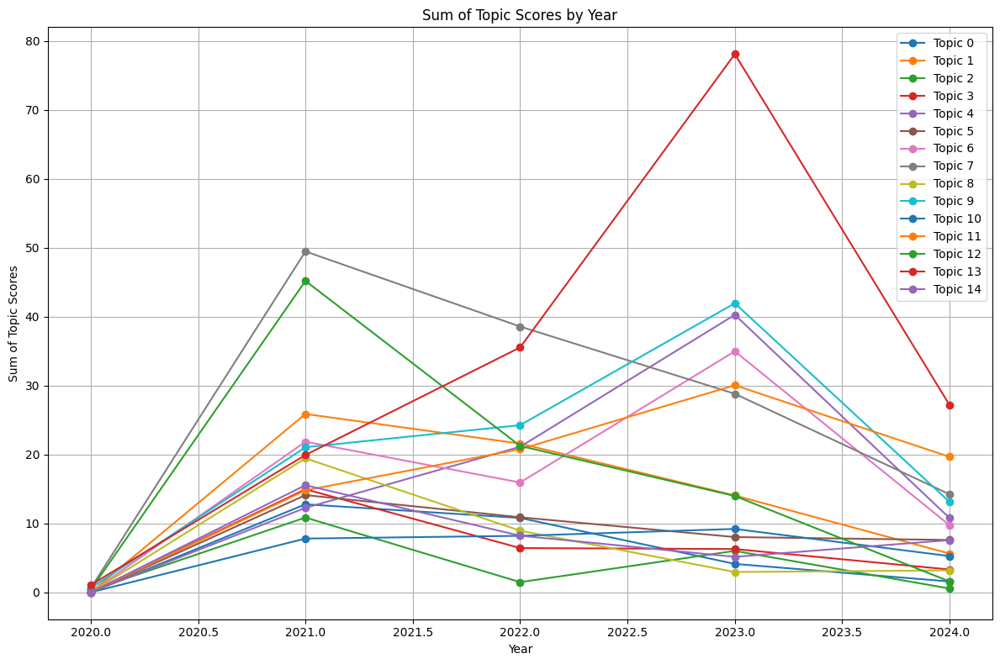

In [53]:
from collections import defaultdict
# Add a column for the year
df_copy['year'] = df_copy['date'].dt.year

# Initialize a dictionary to hold the sum of topic scores for each year
topic_scores_by_year = defaultdict(lambda: defaultdict(float))

# Sum the topic scores for each document by year
for i, doc in enumerate(doc_topics):
    year = df_copy.iloc[i]['year']
    for topic, score in doc:
        topic_scores_by_year[year][topic] += score

# Convert the dictionary to a DataFrame for easier analysis and visualization
topic_scores_df = pd.DataFrame(topic_scores_by_year).T

# Print the topic scores by year
print(topic_scores_df)

# Plot the topic scores by year
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
for topic in topic_scores_df.columns:
    plt.plot(topic_scores_df.index, topic_scores_df[topic], marker='o', label=f'Topic {topic}')

plt.title('Sum of Topic Scores by Year')
plt.xlabel('Year')
plt.ylabel('Sum of Topic Scores')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

                  0         1         2         3         4         5   \
2024-04-01  0.032530  0.054243  0.009170  1.515385  3.646598  2.166294   
2024-03-01  0.715485  1.101139  0.009472  0.743590  2.722154  1.857840   
2024-02-01  0.817521  3.168266  0.522306  0.339944  2.620178  1.833844   
2024-01-01  0.010476  1.301378  0.010476  0.714737  1.792971  1.739529   
2023-12-01  0.763175  0.006765  0.408401  0.946659  2.005994  0.370741   
2023-11-01  0.268693  1.054982  1.910370  0.878900  5.610587  0.847545   
2023-10-01  0.282141  1.225523  0.253032  0.187947  4.213418  0.858736   
2023-09-01  0.182825  1.583165  1.420952  0.133731  2.097474  1.698364   
2023-08-01  0.921268  1.953685  0.006621  1.963302  1.167283  0.238464   
2023-07-01  0.006591  0.417146  0.695282  1.003755  3.345084  0.988515   
2023-06-01  0.007624  1.172481  0.007624  0.007624  3.894677  0.983745   
2023-05-01  0.819973  1.735947  0.428051  0.469692  1.416196  0.168926   
2023-04-01  0.006387  2.400738  0.0063

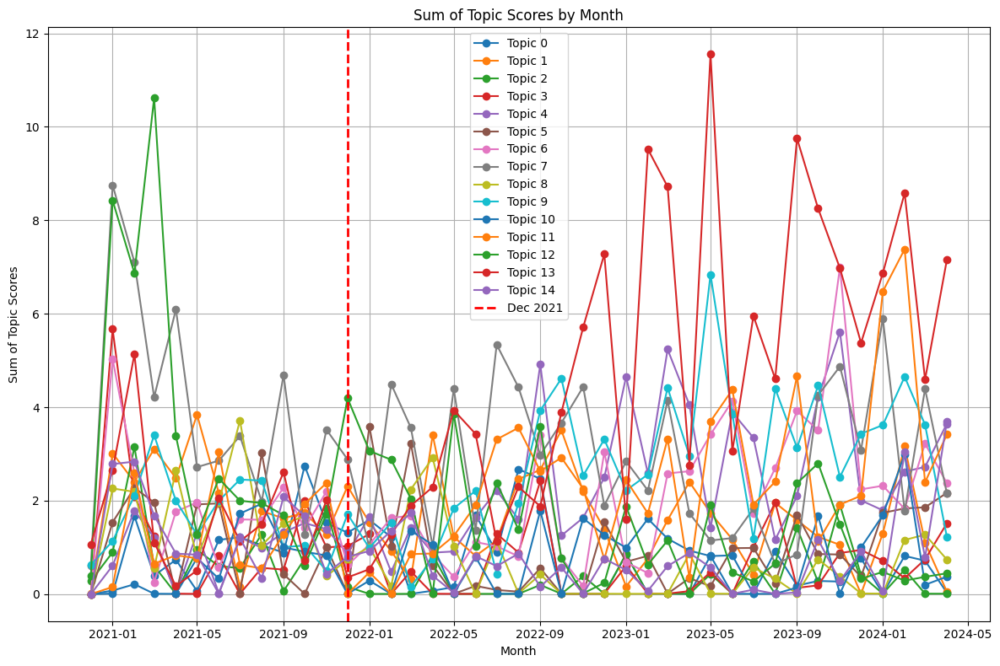

In [55]:
# Add a column for the month and year
df_copy['year_month'] = df_copy['date'].dt.to_period('M')

# Initialize a dictionary to hold the sum of topic scores for each month
topic_scores_by_month = defaultdict(lambda: defaultdict(float))

# Sum the topic scores for each document by month
for i, doc in enumerate(doc_topics):
    year_month = df_copy.iloc[i]['year_month']
    for topic, score in doc:
        topic_scores_by_month[year_month][topic] += score

# Convert the dictionary to a DataFrame for easier analysis and visualization
topic_scores_df = pd.DataFrame(topic_scores_by_month).T
topic_scores_df.index = topic_scores_df.index.to_timestamp()  # Convert PeriodIndex to Timestamp

# Print the topic scores by month
print(topic_scores_df)

# Plot the topic scores by month
plt.figure(figsize=(12, 8))
for topic in topic_scores_df.columns:
    plt.plot(topic_scores_df.index, topic_scores_df[topic], marker='o', label=f'Topic {topic}')

# Add a vertical line for December 2021
plt.axvline(pd.Timestamp('2021-12-01'), color='red', linestyle='--', linewidth=2, label='Dec 2021')

plt.title('Sum of Topic Scores by Month')
plt.xlabel('Month')
plt.ylabel('Sum of Topic Scores')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

             0          1          2          3          4          5   \
2024   1.576012   5.625027   0.551424   3.313656  10.781901   7.597507   
2023   4.124852  14.060975   6.015324   6.283838  40.275482   8.019647   
2022  10.793803  21.588523   1.476310   6.423228  21.123347  10.893652   
2021  12.779141  25.886961  10.853388  14.961925  12.262393  14.111308   
2020   0.000856   0.022180   0.277984   0.000856   0.000856   0.000856   

             6          7          8          9         10         11  \
2024   9.740387  14.227403   3.183901  13.121836  5.258831  19.668327   
2023  34.982875  28.816795   2.951220  41.958769  9.200921  30.057444   
2022  15.941994  38.576326   8.942736  24.259887  8.201043  20.772231   
2021  21.862573  49.477024  19.453491  21.056634  7.802844  14.802859   
2020   0.000856   0.608169   0.000856   0.622444  0.000856   0.000856   

             12         13         14  
2024   1.579957  27.195436   7.578395  
2023  13.981602  78.121873   5.14838

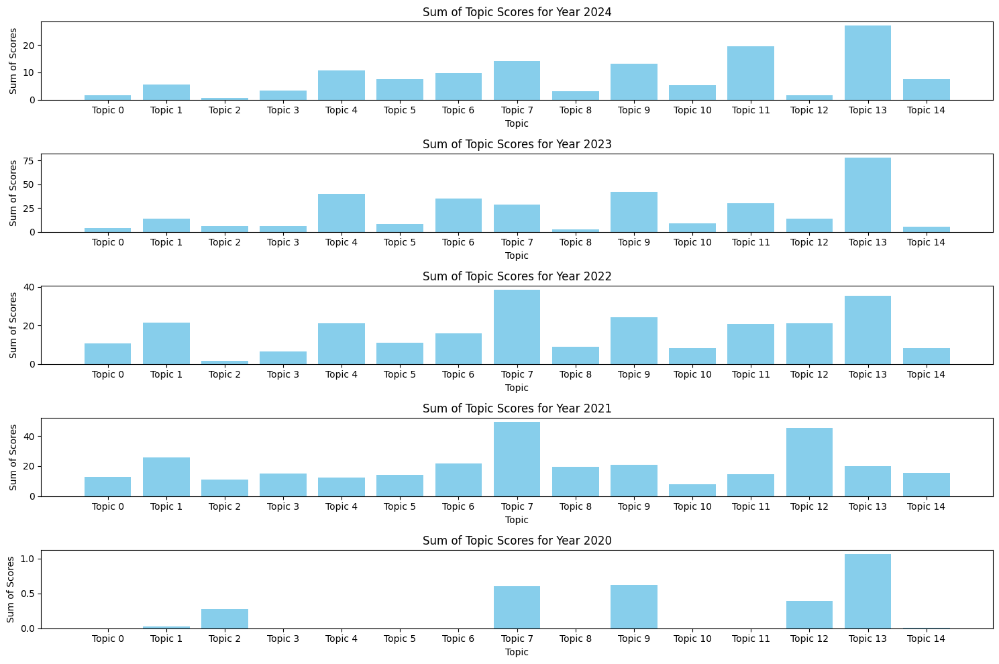

In [54]:

# Add a column for the year
df_copy['year'] = df_copy['date'].dt.year

# Initialize a dictionary to hold the sum of topic scores for each year
topic_scores_by_year = defaultdict(lambda: defaultdict(float))

# Sum the topic scores for each document by year
for i, doc in enumerate(doc_topics):
    year = df_copy.iloc[i]['year']
    for topic, score in doc:
        topic_scores_by_year[year][topic] += score

# Convert the dictionary to a DataFrame for easier analysis and visualization
topic_scores_df = pd.DataFrame(topic_scores_by_year).T

# Print the topic scores by year
print(topic_scores_df)

# Plot the topic scores by year using bar plots
years = topic_scores_df.index
num_topics = len(topic_scores_df.columns)

plt.figure(figsize=(15, 10))

for i, year in enumerate(years):
    plt.subplot(len(years), 1, i + 1)
    plt.bar(range(num_topics), topic_scores_df.loc[year], color='skyblue')
    plt.title(f'Sum of Topic Scores for Year {year}')
    plt.xlabel('Topic')
    plt.ylabel('Sum of Scores')
    plt.xticks(range(num_topics), [f'Topic {j}' for j in range(num_topics)])
    plt.tight_layout()

plt.show()

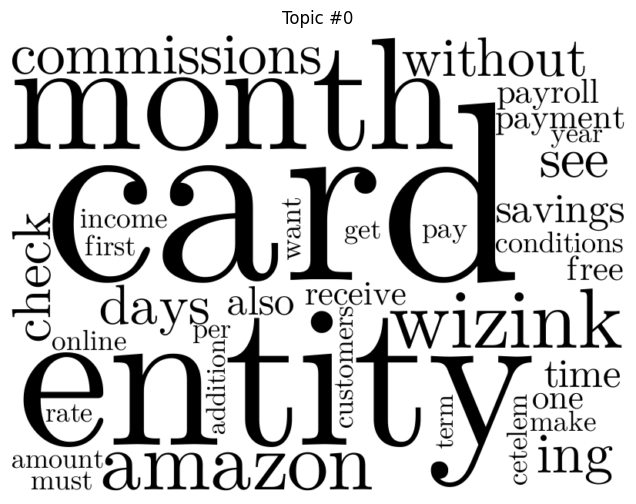

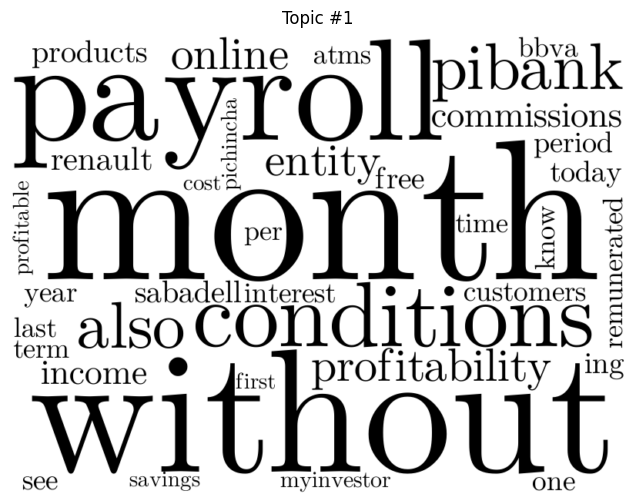

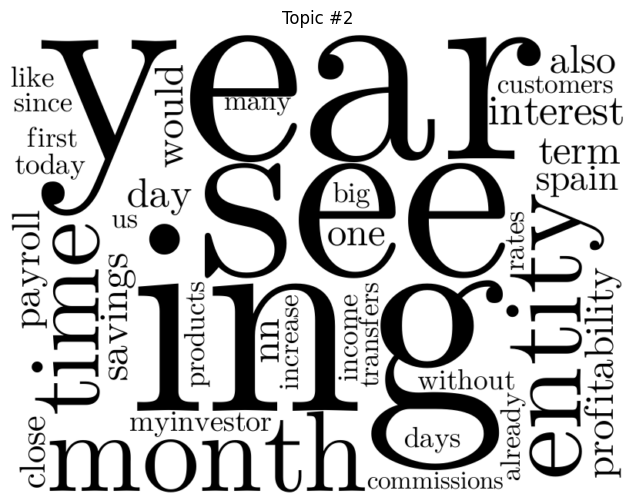

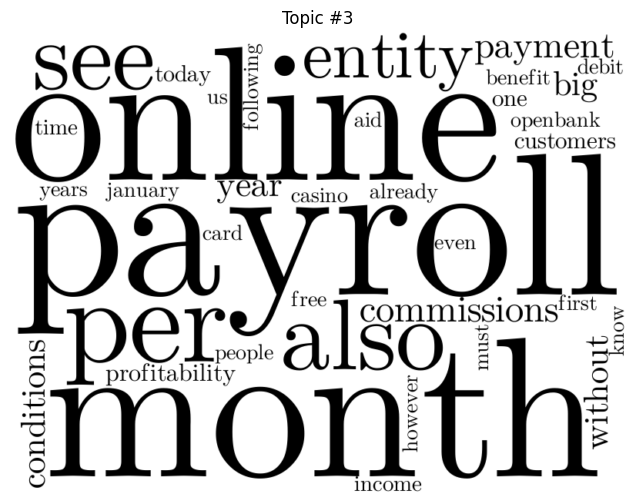

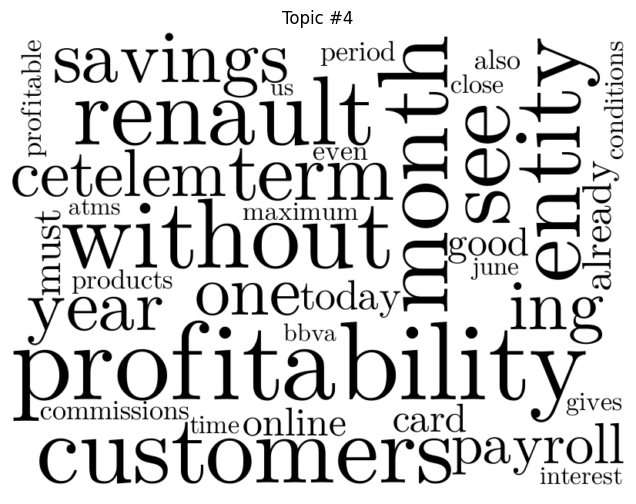

...

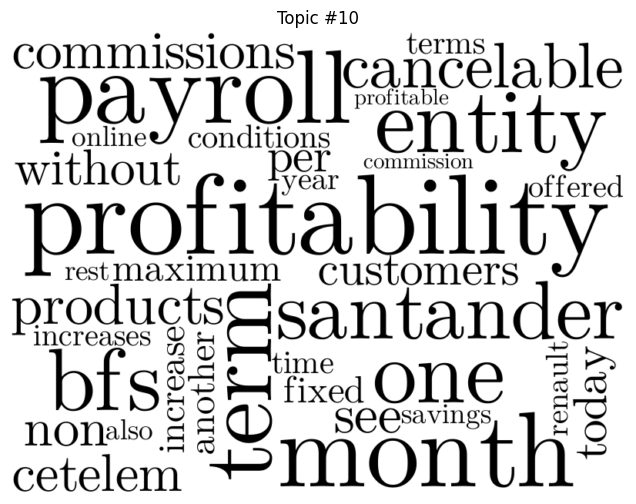

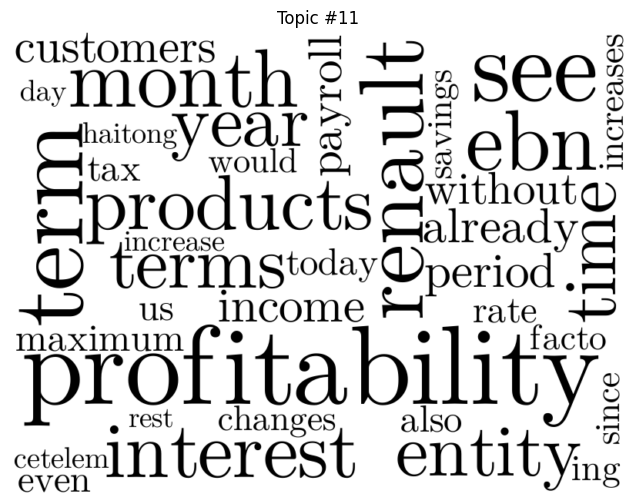

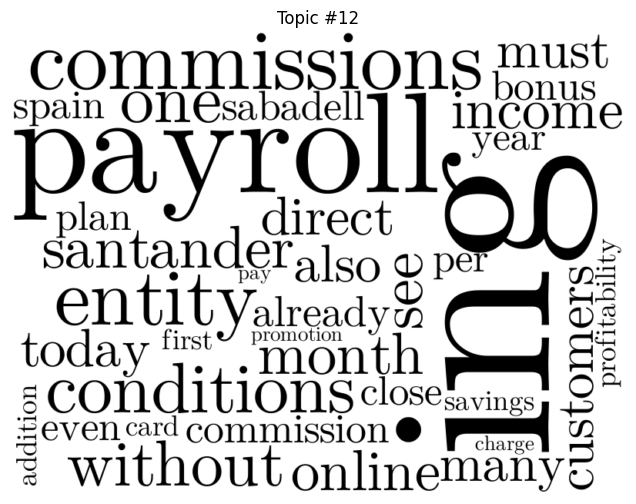

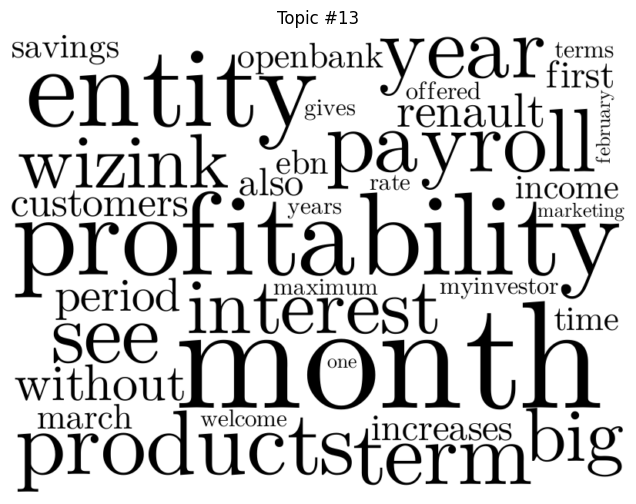

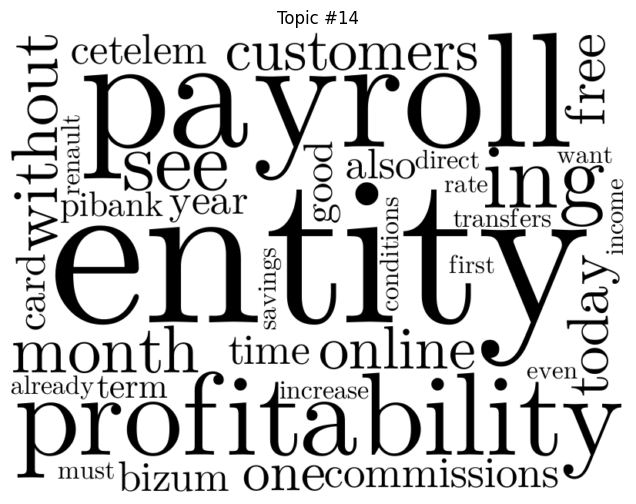

In [59]:
from wordcloud import WordCloud
import emojis
import matplotlib.pyplot as plt

# Define a font path that supports emojis
font_path = 'D:/Hangze Wu/BSE/DSDM/semester3/Master Thesis/github_thesis/deloitte_digital_banking/tucapital_scraper/emoj_Symbola/Symbola.otf'

def generate_wordclouds(topics, dictionary, font_path, score_threshold=0.00001):
    excluded_words = {"bank", "banks", "apr", "client", "clients", "account", "accounts", "orange",
                      "deposit", "deposits", "banco", "new", "months", "offer", "offers", "money"}

    for topic_num, topic_words in topics:
        # Remove excluded words and apply score threshold
        filtered_topic_words = [(word, freq) for word, freq in topic_words if word.lower() not in excluded_words and freq >= score_threshold]

        word_freq = dict(filtered_topic_words)
        wordcloud = WordCloud(
            width=800,
            height=600,
            background_color='white',
            color_func=lambda *args, **kwargs: "black",  # Default color for non-emojis
            font_path=font_path,  # Specify emoji support
            min_font_size=10,
            regexp=r"\S+",  # Regular expression to include all non-whitespace characters
        ).generate_from_frequencies(word_freq)
        
        # Define a custom color function for emojis
        def color_func(word, font_size, position, orientation, random_state=None, **kwargs):
            if word in emojis.UNICODE_EMOJI:  # Check if the word is an emoji
                return "lightblue"  # Set color for emojis
            else:
                return "black"  # Default color for non-emojis
        
        # Apply the custom color function
        wordcloud.color_func = color_func
        
        plt.figure(figsize=(8, 6), facecolor=None)
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f'Topic #{topic_num}')
        plt.show()

# Generate word clouds for each topic
generate_wordclouds(topics, lda_model.id2word, font_path, score_threshold=0.00236)
